# Transit Stop Accessibility Example
This notebook explores and visualizes ramp and pedestrian accessibility data.

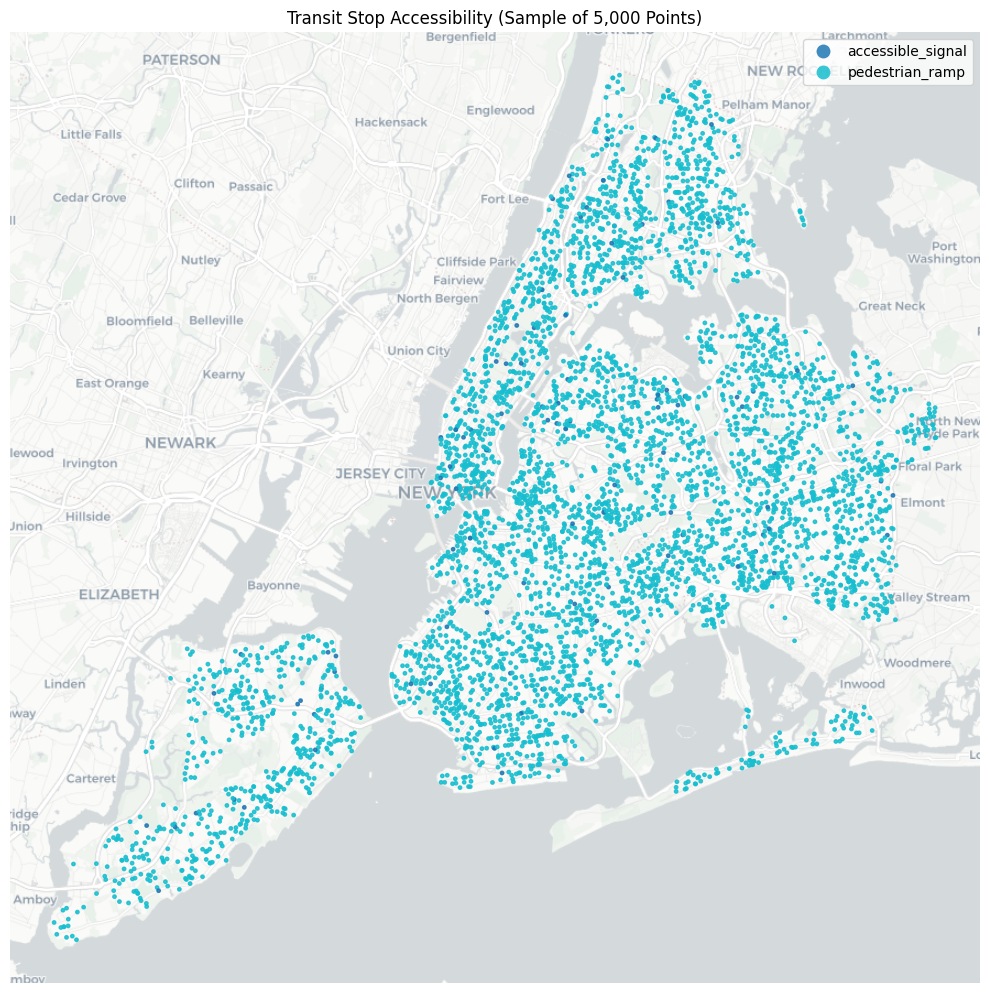

In [12]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

# Load full dataset
csv_path = "../data/transit_stop_accessibility/transit_stop_accessibility_merged.csv"
df = pd.read_csv(csv_path, low_memory=False)

# Convert to GeoDataFrame first
gdf = gpd.GeoDataFrame(
    df,
    geometry=gpd.points_from_xy(df["lon"], df["lat"]),
    crs="EPSG:4326"
)

# Sample AFTER assigning CRS
gdf_sample = gdf.sample(n=5000, random_state=42).to_crs(epsg=3857)

# Plot
fig, ax = plt.subplots(figsize=(10, 10))
gdf_sample.plot(
    ax=ax,
    column="source",
    categorical=True,
    markersize=6,
    legend=True,
    alpha=0.85
)

# Add basemap
try:
    import contextily as cx
    cx.add_basemap(
        ax,
        source=cx.providers.CartoDB.Positron,
        attribution=False
    )
except ImportError:
    print("contextily not installed — run `pip install contextily`")

ax.set_title("Transit Stop Accessibility (Sample of 5,000 Points)")
ax.axis("off")
plt.tight_layout()
plt.show()

In [13]:
import pandas as pd

df = pd.read_csv("../data/transit_stop_accessibility/transit_stop_accessibility_merged.csv")

/var/folders/0q/f6wdygs95dz97f63ll8xv7mc0000gn/T/ipykernel_20502/1568747804.py:3: DtypeWarning: Columns (4,27,29,34,35,36,37,38,40) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("../data/transit_stop_accessibility/transit_stop_accessibility_merged.csv")


In [14]:
import datamart_profiler

metadata = datamart_profiler.process_dataset(df, include_sample=True, plots=True)

In [15]:
import json

with open("../data_profiles/transit_stop_accessibility.json", "w") as f:
    json.dump(metadata, f, indent=2)

In [16]:
import DataProfileViewer
DataProfileViewer.plot_data_summary(metadata)